In [3]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt

In [6]:
def load_data(filename):
    m = np.array(pd.read_csv(filename, header=None))
    return np.tril(m) + np.tril(m).transpose()

def show_heapmap(m, title=None, subtitle=None, vmin=None, vmax=None, yticks=True, figsize=None):
    vmin = np.nanmin(m) if vmin is None else vmin
    vmax = np.nanmax(m) if vmax is None else vmax
    black_at = (vmin+3*vmax)/4
    subtitle = "Core-to-core latency" if subtitle is None else subtitle
    
    isnan = np.isnan(m)

    plt.rcParams['xtick.bottom'] = plt.rcParams['xtick.labelbottom'] = False
    plt.rcParams['xtick.top'] = plt.rcParams['xtick.labeltop'] = True

    figsize = np.array(m.shape)*0.3 + np.array([6,1]) if figsize is None else figsize
    fig, ax = plt.subplots(figsize=figsize, dpi=130)
    
    fig.patch.set_facecolor('w')
    
    plt.imshow(np.full_like(m, 0.7), vmin=0, vmax=1, cmap = 'gray') # for the alpha value
    plt.imshow(m, cmap = plt.cm.get_cmap('viridis'), vmin=vmin, vmax=vmax)
    
    fontsize = 9 if vmax >= 100 else 10

    for (i,j) in np.ndindex(m.shape):
        t = "" if isnan[i,j] else f"{m[i,j]:.1f}" if vmax < 10.0 else f"{m[i,j]:.0f}"
        c = "w" if m[i,j] < black_at else "k"
        plt.text(j, i, t, ha="center", va="center", color=c, fontsize=fontsize)
        
    plt.xticks(np.arange(m.shape[1]), labels=[f"{i+1}" for i in range(m.shape[1])], fontsize=9)
    if yticks:
        plt.yticks(np.arange(m.shape[0]), labels=[f"CPU {i+1}" for i in range(m.shape[0])], fontsize=9)
    else:
        plt.yticks([])

    plt.tight_layout()
    plt.title(f"{title}\n" +
              f"{subtitle}\n" +
              f"Min={vmin:0.1f}ns Median={np.nanmedian(m):0.1f}ns Max={vmax:0.1f}ns",
              fontsize=11, linespacing=1.5)

# Intel Core i9-12900K @ 8+8 Cores (Alder Lake, 12th gen)

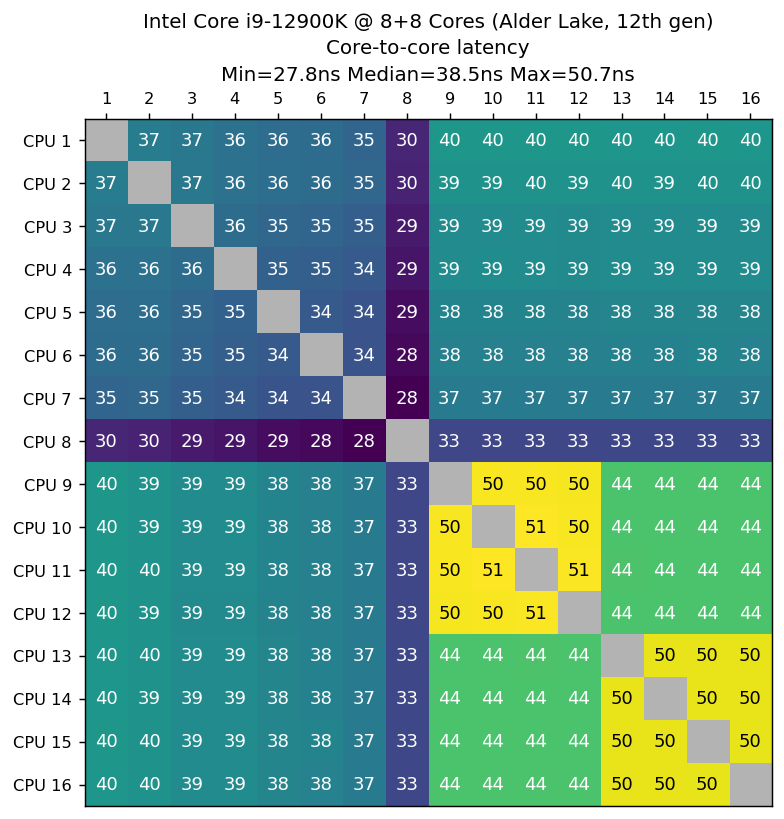

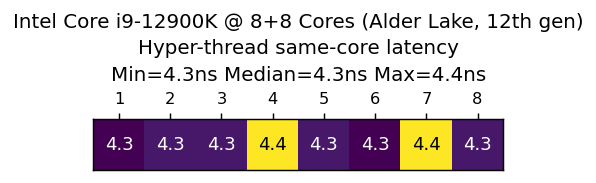

In [52]:
cpu = "Intel Core i9-12900K @ 8+8 Cores (Alder Lake, 12th gen)"
fname = "Intel Core i9-12900K.csv"
m = load_data(fname)

n1=8
n2=8

noht = np.delete(m,    range(1, n1*2, 2), axis=0)
noht = np.delete(noht, range(1, n1*2, 2), axis=1)

show_heapmap(noht, title=cpu)

show_heapmap(np.diag(m[:n1*2:2,1:n1*2:2]).reshape((1,n1)), yticks=False, figsize=(3.5, 4),
             title=cpu, subtitle="Hyper-thread same-core latency")

# Intel Core i9-9900K @ 3.60 GHz 8 Cores (Coffee Lake, 8th gen)

(8, 8)
(1, 8)


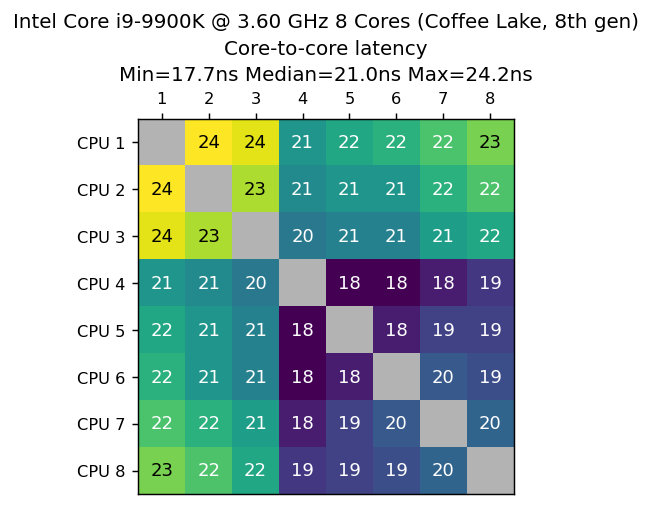

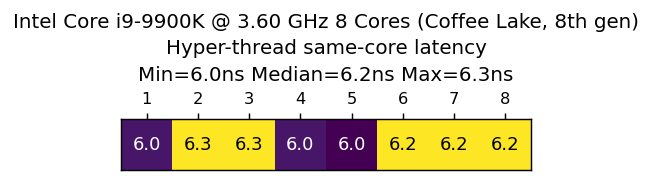

In [63]:
cpu = "Intel Core i9-9900K @ 3.60 GHz 8 Cores (Coffee Lake, 8th gen)"
fname = "Intel Core i9-9900K CPU @ 3.60 GHz.csv"
m = load_data(fname)
n = 8
show_heapmap(m[::2,::2], title=cpu)

show_heapmap(np.diag(m[::2,1::2]).reshape((1,n)), yticks=False, figsize=(3.5, 4),
             title=cpu, subtitle="Hyper-thread same-core latency")

# Intel Core i7-1165G7 @ 2.80GHz 4 Cores (Tiger Lake, 11th gen)

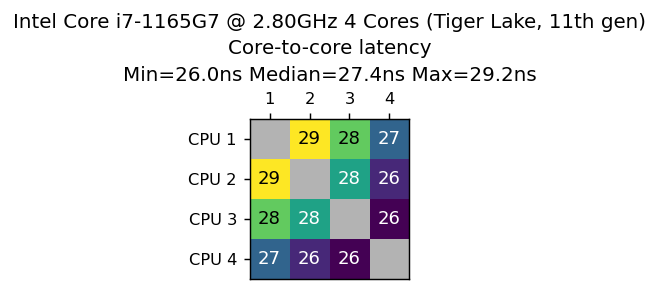

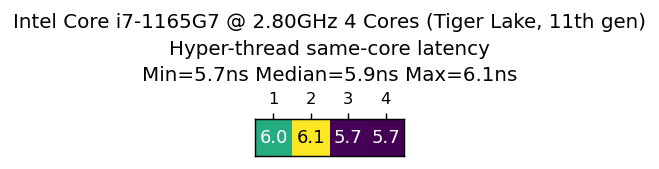

In [39]:
cpu = "Intel Core i7-1165G7 @ 2.80GHz 4 Cores (Tiger Lake, 11th gen)"
fname = "Intel(R) Core(TM) i7-1165G7 @ 2.80GHz.csv"
m = load_data(fname)
n = 4
show_heapmap(m[:n,:n], title=cpu, figsize=(2,3))

show_heapmap(np.diag(m[n:,:n]).reshape((1,n)), yticks=False, figsize=(3.5, 0.8),
             title=cpu, subtitle="Hyper-thread same-core latency")

# Intel Core i5-10310U, 4 Cores, Comet Lake, 10th gen, 2020-Q2

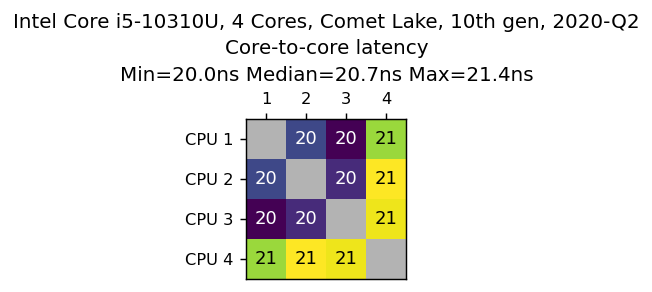

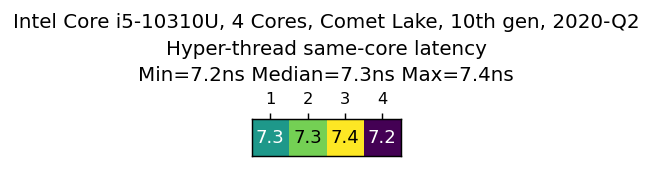

In [75]:
cpu = "Intel Core i5-10310U, 4 Cores, Comet Lake, 10th gen, 2020-Q2"
fname = "Intel Core i5-10310U.csv"
m = load_data(fname)
n = 4
show_heapmap(m[:n,:n], title=cpu, figsize=(2,3))

show_heapmap(np.diag(m[n:,:n]).reshape((1,n)), yticks=False, figsize=(3.5, 0.8),
             title=cpu, subtitle="Hyper-thread same-core latency")

# Intel Core i5-4590 CPU @ 3.30GHz 4 Cores (Haswell, 4th gen)

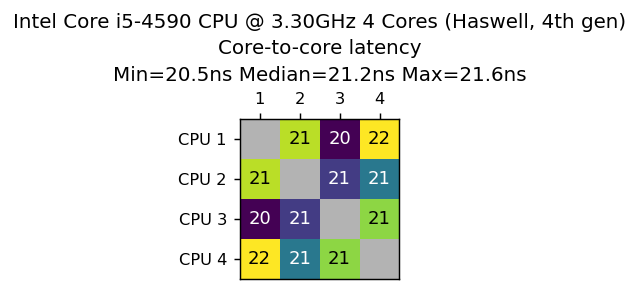

In [25]:
cpu = "Intel Core i5-4590 CPU @ 3.30GHz 4 Cores (Haswell, 4th gen)"
fname = "Intel(R) Core(TM) i5-4590 CPU @ 3.30GHz.csv"
m = load_data(fname)
show_heapmap(m, title=cpu, figsize=(2,3))

# Intel Xeon Platinum 8375C @ 2.90GHz 32 Cores (Ice Lake, 3rd gen)

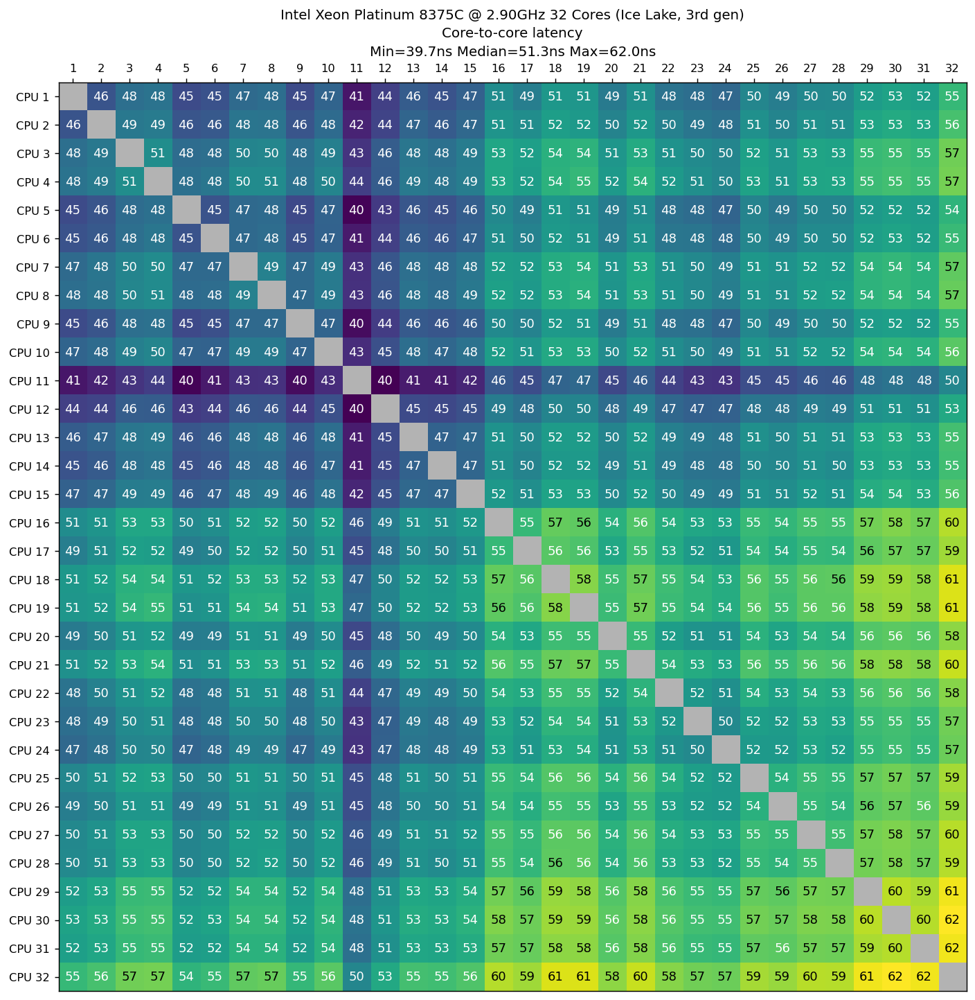

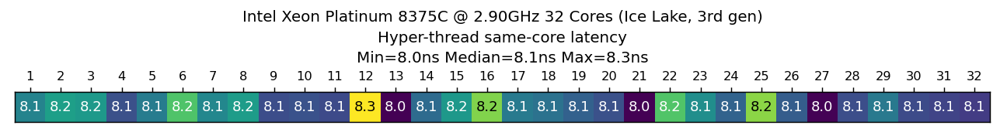

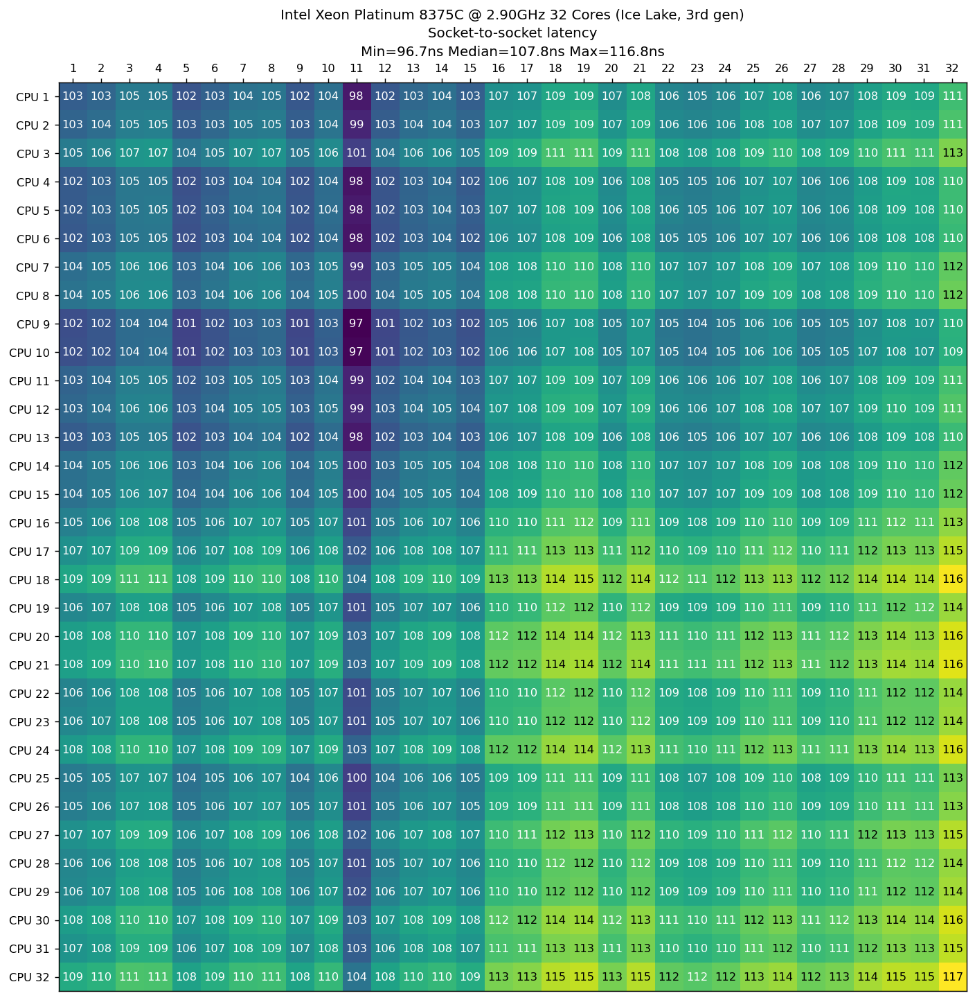

In [7]:
cpu = "Intel Xeon Platinum 8375C @ 2.90GHz 32 Cores (Ice Lake, 3rd gen)"
fname = "Intel(R) Xeon(R) Platinum 8375C CPU @ 2.90GHz.csv"
m = load_data(fname)
n = 32
show_heapmap(m[:n,:n], title=cpu)
# This is the second socket
#show_heapmap(m[n:2*n,n:2*n], title=cpu)

show_heapmap(np.diag(m[2*n:3*n,:n]).reshape((1,n)), yticks=False, figsize=(10,5),
             title=cpu, subtitle="Hyper-thread same-core latency")

show_heapmap(m[n:2*n,:n], title=cpu, subtitle="Socket-to-socket latency")

# Intel Xeon Platinum 8275CL @ 3.00GHz 24 Cores (Cascade Lake, 2nd gen)

(24, 24)
(1, 24)
(24, 24)


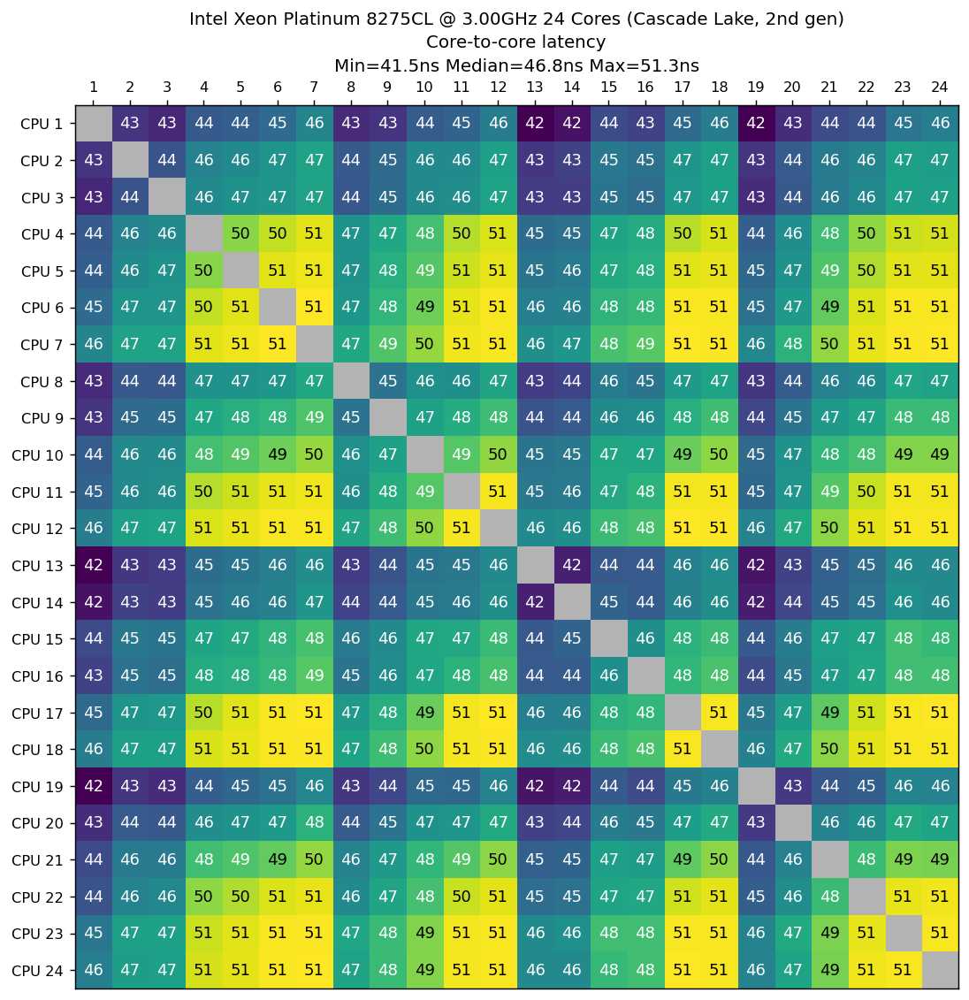

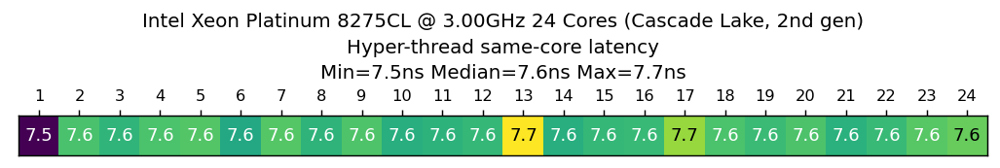

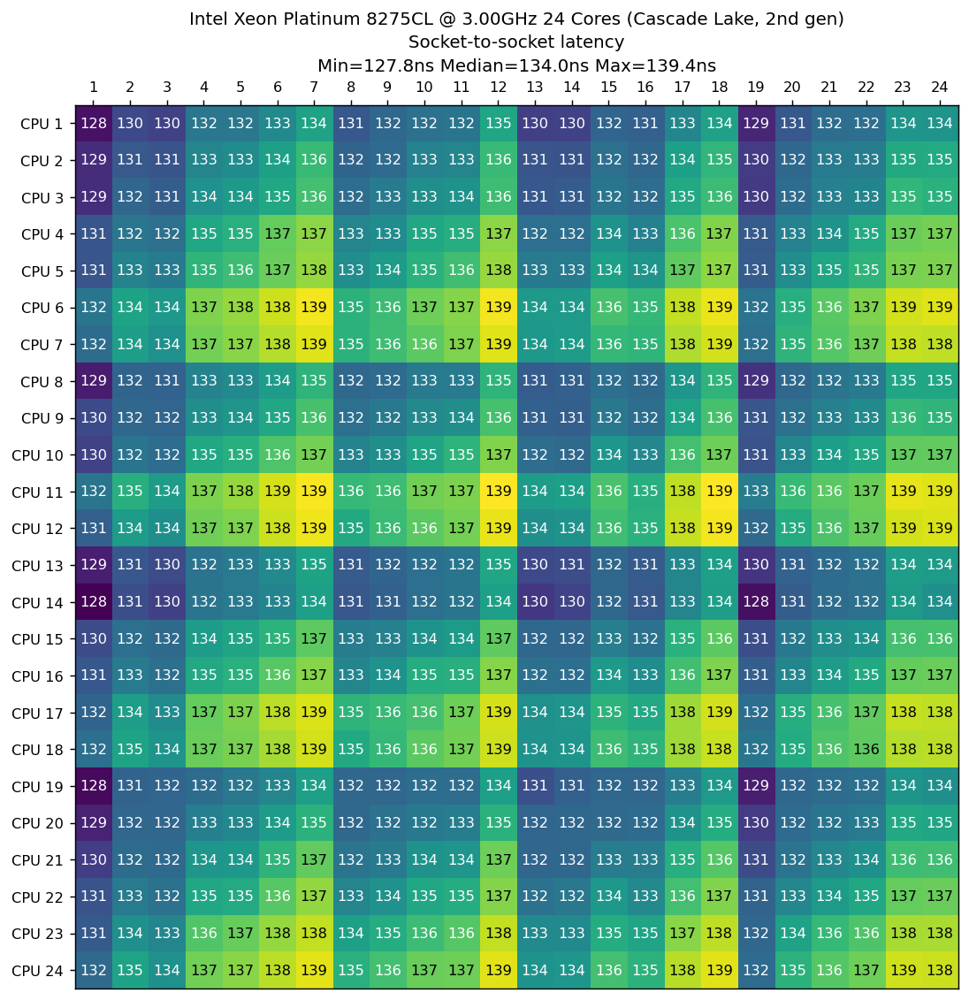

In [62]:
cpu = "Intel Xeon Platinum 8275CL @ 3.00GHz 24 Cores (Cascade Lake, 2nd gen)"
fname = "Intel(R) Xeon(R) Platinum 8275CL CPU @ 3.00GHz.csv"
m = load_data(fname)
n = 24
show_heapmap(m[:n,:n], title=cpu)
# This is the second socket
#show_heapmap(m[n:2*n,n:2*n], title=cpu)

show_heapmap(np.diag(m[2*n:3*n,:n]).reshape((1,n)), yticks=False, figsize=(8,5),
             title=cpu, subtitle="Hyper-thread same-core latency")

show_heapmap(m[n:2*n,:n], title=cpu, subtitle="Socket-to-socket latency")

# Intel Xeon E5-2695 v4 @ 2.10GHz 18 Cores (Broadwell, 5th gen)

(18, 18)
(1, 18)
(18, 18)


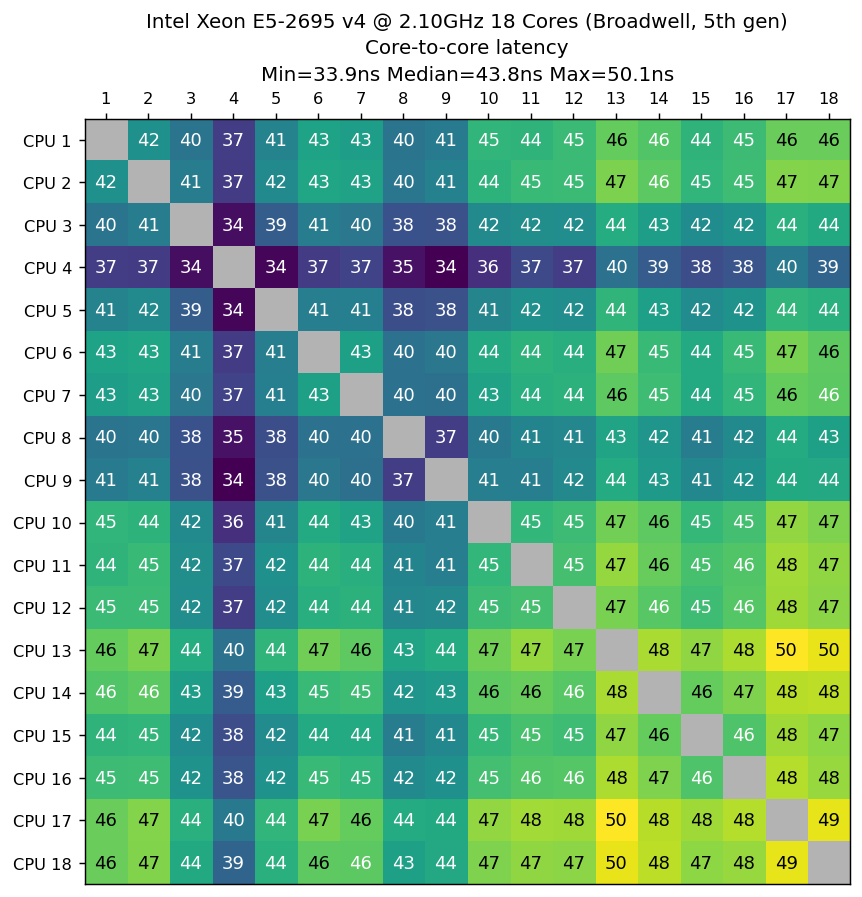

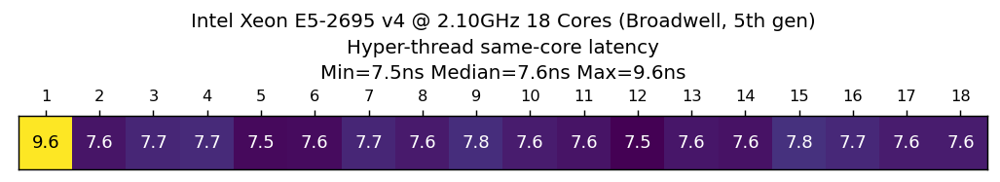

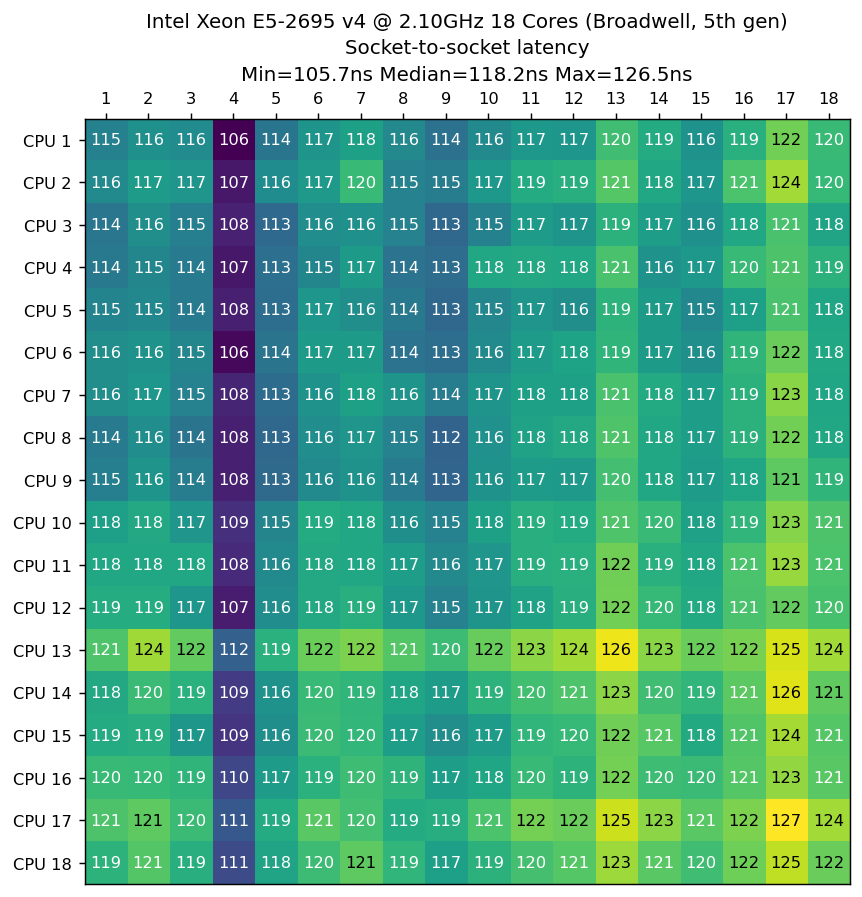

In [70]:
cpu = "Intel Xeon E5-2695 v4 @ 2.10GHz 18 Cores (Broadwell, 5th gen)"
fname = "Intel(R) Xeon(R) CPU E5-2695 v4 @ 2.10GHz.csv"
m = load_data(fname)
n = 18
show_heapmap(m[:n,:n], title=cpu)
# This is the second socket
#show_heapmap(m[n:2*n,n:2*n], title=cpu)

show_heapmap(np.diag(m[2*n:3*n,:n]).reshape((1,n)), yticks=False, figsize=(8,5),
             title=cpu, subtitle="Hyper-thread same-core latency")

show_heapmap(m[n:2*n,:n], title=cpu, subtitle="Socket-to-socket latency")

# AMD EPYC 7R13 @ 48 Cores (Milan, 3rd gen)

## Note: There seem to be an anomaly with Socket 2. It's much slower than Socket 1. See below. The machine is a _c6a.metal_ from AWS

(48, 48)
(48, 48)
(1, 48)
(48, 48)


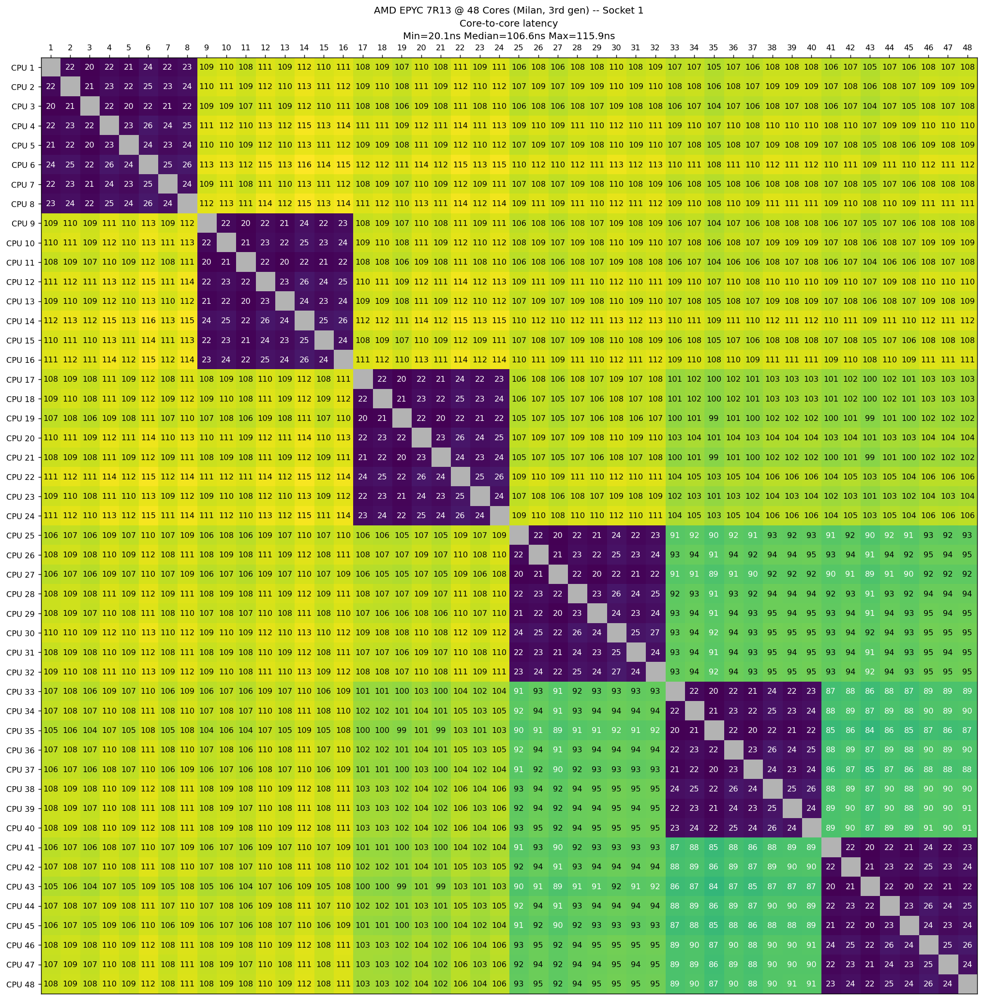

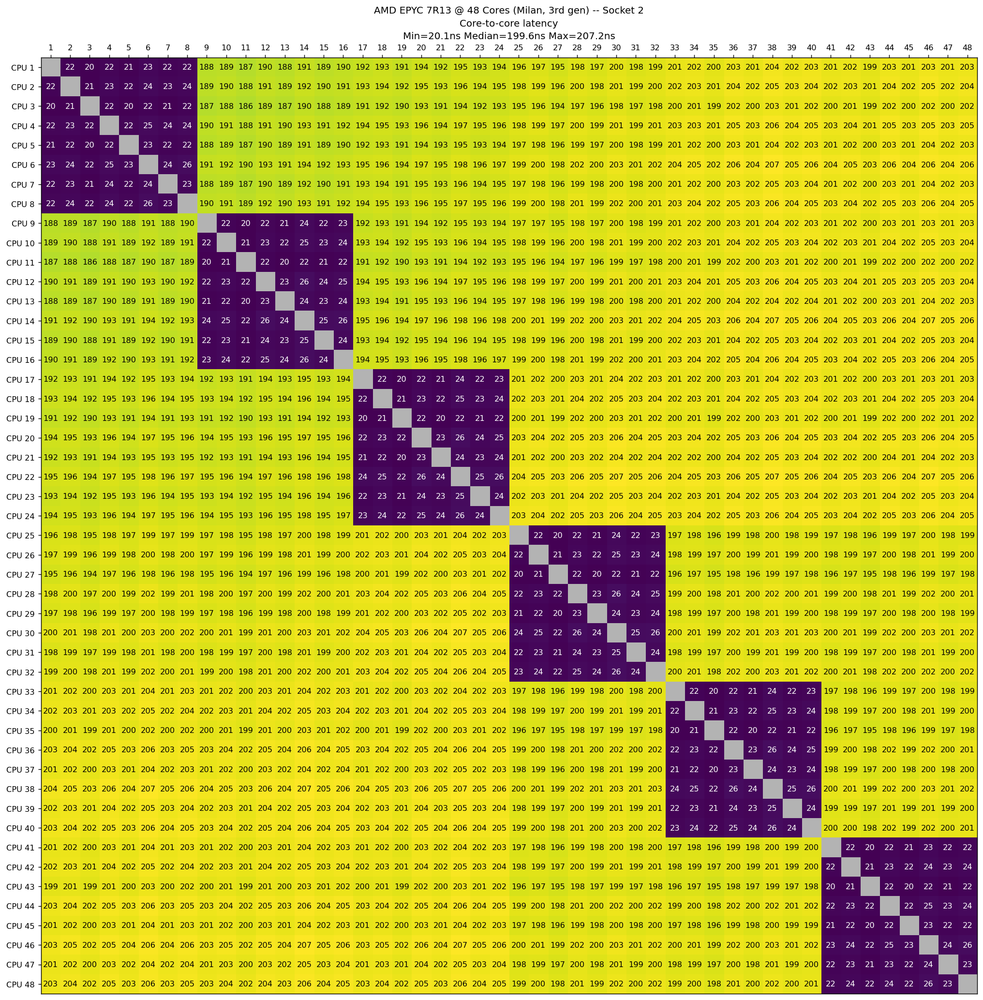

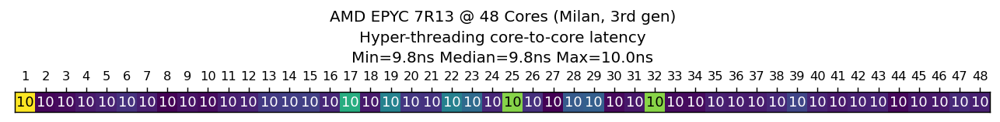

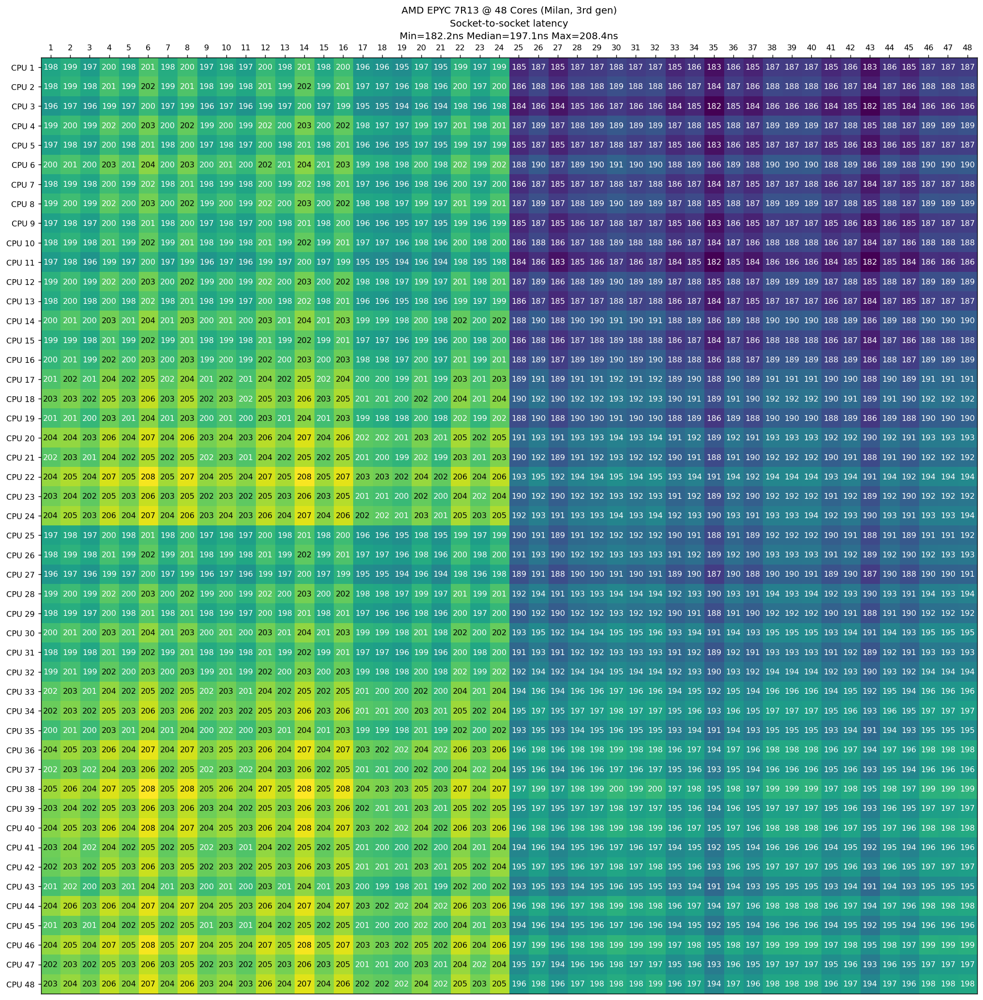

In [64]:
cpu = "AMD EPYC 7R13 @ 48 Cores (Milan, 3rd gen)"
fname = "AMD EPYC 7R13 48-Core Processor.csv"
m = load_data(fname)
n = 48
show_heapmap(m[:n,:n], title=f"{cpu} -- Socket 1")
# This is the second socket
show_heapmap(m[n:2*n,n:2*n], title=f"{cpu} -- Socket 2")

show_heapmap(np.diag(m[2*n:3*n,:n]).reshape((1,n)), yticks=False, figsize=(10, 3),
             title=cpu, subtitle="Hyper-threading core-to-core latency")

show_heapmap(m[n:2*n,:n], title=cpu, subtitle="Socket-to-socket latency")

# AMD Ryzen 7 5700X @ 3.40 GHz 8 Cores (Zen3, 4th gen)

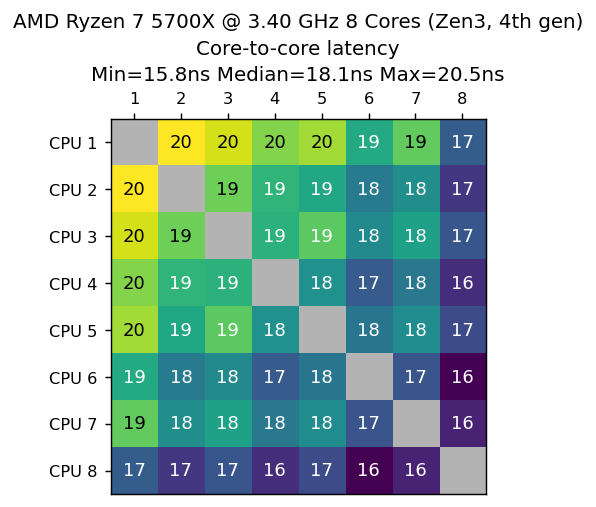

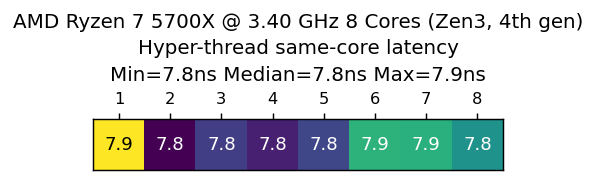

In [74]:
cpu ="AMD Ryzen 7 5700X @ 3.40 GHz 8 Cores (Zen3, 4th gen)"
fname = "AMD Ryzen 7 5700X.csv"

n = 8
m = load_data(fname)
show_heapmap(m[:n,:n], title=f"{cpu}")

show_heapmap(np.diag(m[n::,:n:]).reshape((1,n)), yticks=False, figsize=(3.5, 4),
             title=cpu, subtitle="Hyper-thread same-core latency")

# AMD Ryzen 9 5950X @ 3.40 GHz 16 Cores (Zen3, 4th gen)

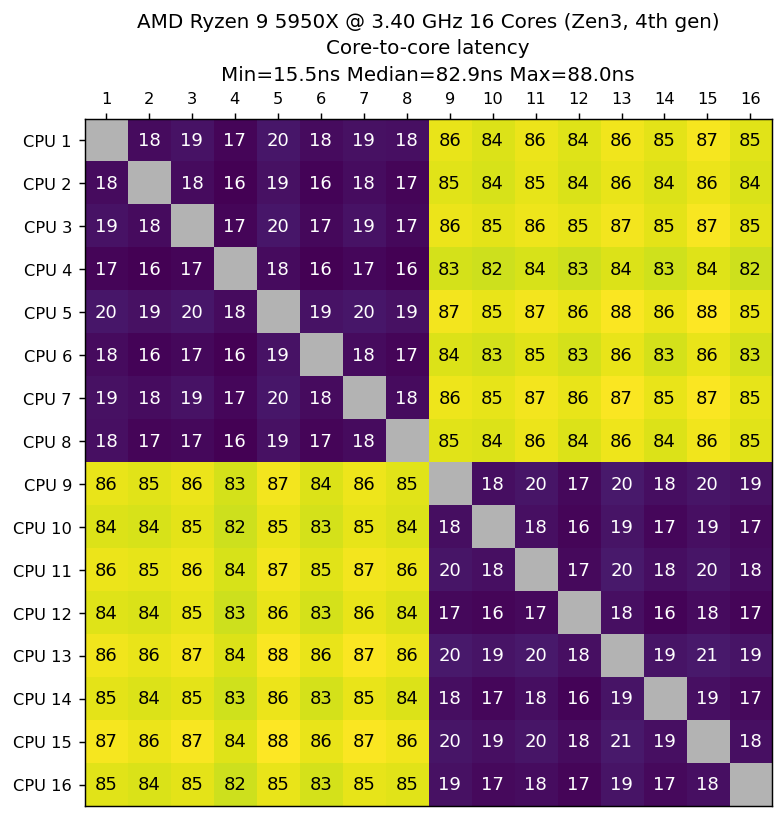

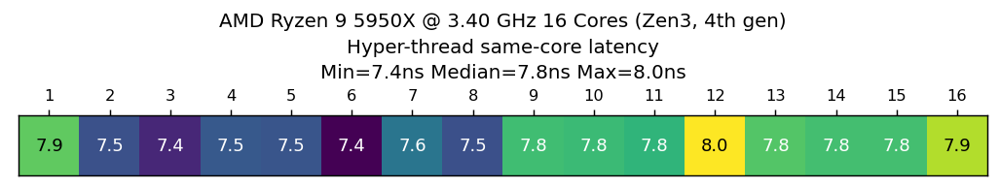

In [18]:
cpu = "AMD Ryzen 9 5950X @ 3.40 GHz 16 Cores (Zen3, 4th gen)"
fname = "AMD Ryzen 9 5950X @ 3.40 GHz.csv"
m = load_data(fname)
n = 16
show_heapmap(m[:n,:n], title=cpu)

show_heapmap(np.diag(m[n:2*n,:n]).reshape((1,n)), yticks=False, figsize=(8,5),
             title=cpu, subtitle="Hyper-thread same-core latency")

# AMD Ryzen 7 2700X @ 3.70 GHz 8 Cores (Zen+, 2nd gen)

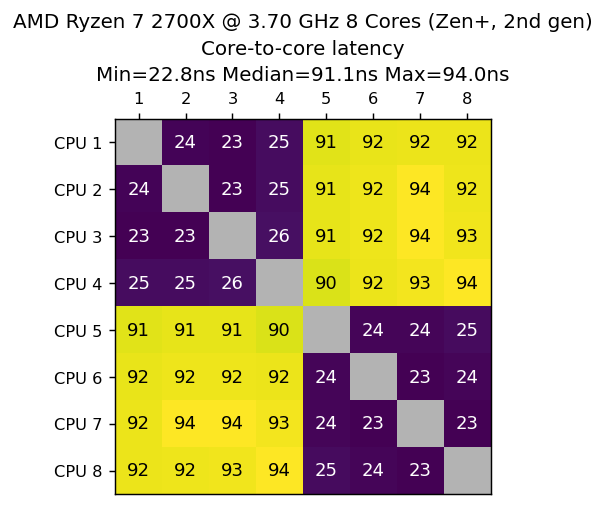

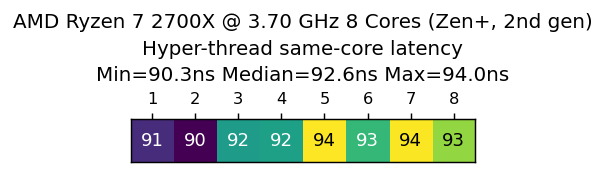

In [65]:
cpu = "AMD Ryzen 7 2700X @ 3.70 GHz 8 Cores (Zen+, 2nd gen)"
fname = "AMD Ryzen 7 2700X Eight-Core Processor.csv"
m = load_data(fname)
n = 8
show_heapmap(m[::2, ::2], title=cpu)

show_heapmap(np.diag(m[n:2*n,:n]).reshape((1,n)), yticks=False, figsize=(3,1),
             title=cpu, subtitle="Hyper-thread same-core latency")

# AWS Graviton3 @ 64 Cores (Arm Neoverse, 3rd gen)

(64, 64)


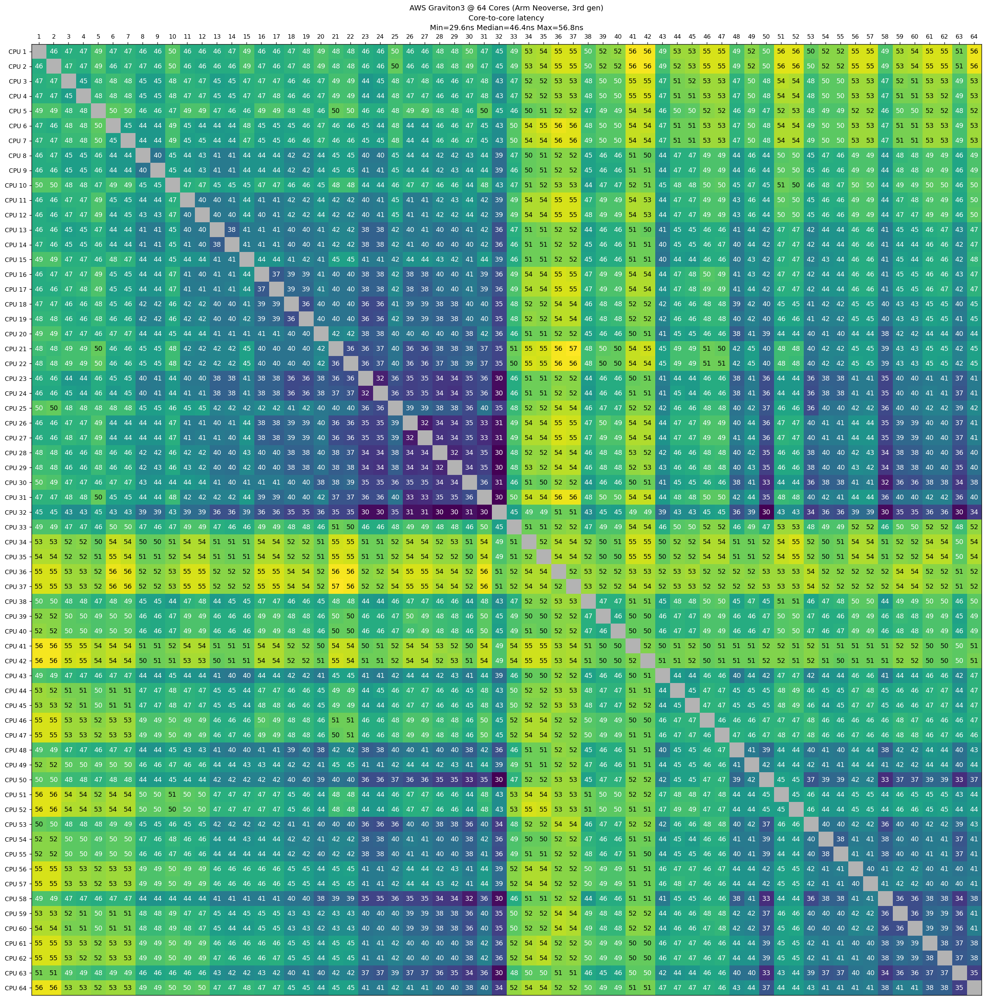

In [65]:
cpu = "AWS Graviton3 @ 64 Cores (Arm Neoverse, 3rd gen)"
fname = "AWS Graviton3.csv"
m = load_data(fname)
show_heapmap(m, title=cpu)

# AWS Graviton2 @ 64 Cores (Arm Neoverse, 2nd gen)

(64, 64)


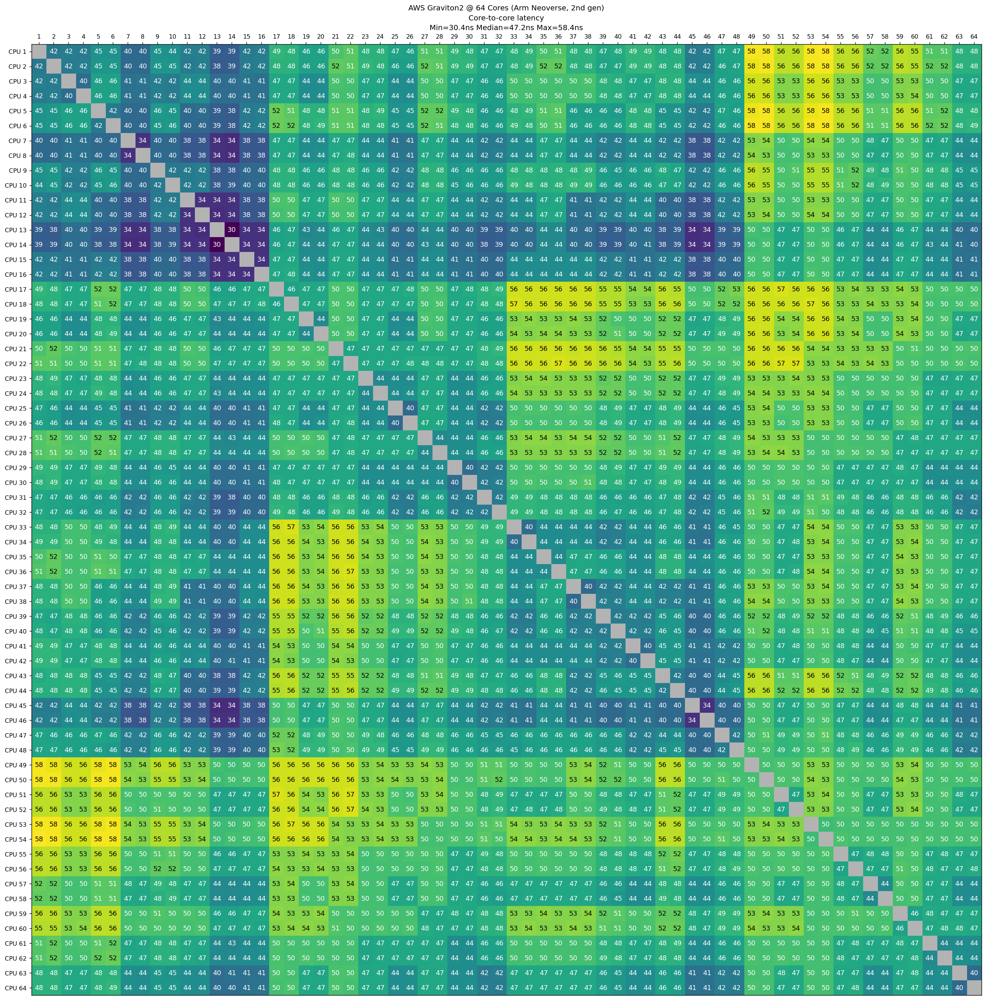

In [66]:
cpu = "AWS Graviton2 @ 64 Cores (Arm Neoverse, 2nd gen)"
fname = "AWS Graviton2.csv"
m = load_data(fname)
show_heapmap(m, title=cpu)

In [59]:
print("\n"*100)